# AirBnB Listings in Los Angeles, CA
##### Data source: http://insideairbnb.com/get-the-data.html
##### Date compiled: May 8, 2020
## Explanatory Visualizations

### Dependencies

In [1]:
from datetime import datetime

from scipy import stats
import numpy as np
import pandas as pd

import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
from PIL import Image
from wordcloud import WordCloud, STOPWORDS, ImageColorGenerator

from utils import utils, plotting

%matplotlib inline

In [2]:
# Settings
pd.options.display.max_columns = 200
pd.options.display.max_rows = 50000
sns.set()
px.set_mapbox_access_token(utils.get_token())

### Data

In [3]:
listings = pd.read_pickle('data/listings_clean.pkl')
listings.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 37028 entries, 0 to 37047
Data columns (total 38 columns):
 #   Column                            Non-Null Count  Dtype         
---  ------                            --------------  -----         
 0   id                                37028 non-null  int64         
 1   host_is_superhost                 37028 non-null  float64       
 2   neighbourhood_cleansed            37028 non-null  object        
 3   zipcode                           37028 non-null  object        
 4   latitude                          37028 non-null  float64       
 5   longitude                         37028 non-null  float64       
 6   property_type                     37028 non-null  object        
 7   room_type                         37028 non-null  object        
 8   accommodates                      37028 non-null  int64         
 9   bathrooms                         37028 non-null  float64       
 10  bedrooms                          37028 non-nu

### Rename and recast columns

In [4]:
# Rename columns to simpler names
listings.rename(columns={'host_is_superhost': 'by_superhost',
                         'neighbourhood_cleansed': 'neighborhood',
                         'review_scores_rating': 'score_rtg',
                         'review_scores_accuracy': 'score_accu',
                         'review_scores_cleanliness': 'score_clean',
                         'review_scores_checkin': 'score_check',
                         'review_scores_communication': 'score_comm',
                         'review_scores_location': 'score_loc',
                         'review_scores_value': 'score_val'}, inplace=True)

# Cast `by_superhost` as integer type
listings['by_superhost'] = listings.by_superhost.astype(int)
listings.head(2)

,id,by_superhost,neighborhood,zipcode,latitude,longitude,property_type,room_type,accommodates,bathrooms,bedrooms,beds,price,security_deposit,cleaning_fee,guests_included,extra_people,minimum_nights,availability_30,availability_60,availability_90,availability_365,number_of_reviews,number_of_reviews_ltm,first_review,last_review,score_rtg,score_accu,score_clean,score_check,score_comm,score_loc,score_val,instant_bookable,cancellation_policy,require_guest_profile_picture,require_guest_phone_verification,reviews_per_month
0,109,0,Culver City,90230,33.98209,-118.38494,Condominium,Entire home/apt,6,2.0,2.0,3.0,122.0,500.0,240.0,3,25.0,30,0,0,0,38,2,0,2011-08-15,2016-05-15,80.0,10.0,10.0,6.0,8.0,10.0,8.0,0,strict_14_with_grace_period,1,0,0.02
1,344,0,Burbank,91505,34.16562,-118.33458,House,Entire home/apt,6,1.0,3.0,3.0,168.0,0.0,100.0,6,0.0,15,0,1,6,97,8,2,2016-06-14,2019-10-19,97.0,10.0,10.0,10.0,10.0,10.0,10.0,1,flexible,0,0,0.17


### Filter out listings with an outlier price

In [5]:
list765 = listings[listings.price <= 765].copy()
list765.describe()

,id,by_superhost,latitude,longitude,accommodates,bathrooms,bedrooms,beds,price,security_deposit,cleaning_fee,guests_included,extra_people,minimum_nights,availability_30,availability_60,availability_90,availability_365,number_of_reviews,number_of_reviews_ltm,score_rtg,score_accu,score_clean,score_check,score_comm,score_loc,score_val,instant_bookable,require_guest_profile_picture,require_guest_phone_verification,reviews_per_month
count,3.556300e+04,35563.000000,35563.000000,35563.000000,35563.000000,35563.000000,35563.000000,35563.000000,35563.000000,35563.000000,35563.000000,35563.000000,35563.000000,35563.000000,35563.000000,35563.000000,35563.000000,35563.000000,35563.000000,35563.000000,28295.000000,28248.000000,28249.000000,28238.000000,28247.000000,28234.000000,28230.000000,35563.000000,35563.000000,35563.000000,35563.000000
mean,2.505182e+07,0.328797,34.050258,-118.313326,3.442032,1.371439,1.344740,1.862947,140.761016,269.070410,76.392655,1.848466,14.443916,15.482833,14.973849,32.450384,50.488120,165.779406,36.362371,12.142733,94.269553,9.612928,9.416652,9.748212,9.717386,9.705001,9.432944,0.436015,0.013582,0.021258,1.312094
std,1.280203e+07,0.469783,0.121526,0.163990,2.410231,0.772871,0.972507,1.518274,115.610321,594.610912,79.641091,1.594151,24.709441,11.178341,13.336440,25.868994,38.232703,142.389288,65.212058,18.640812,9.013689,0.887676,1.008461,0.774724,0.827613,0.730063,0.935986,0.495896,0.115747,0.144245,1.707011
min,1.090000e+02,0.000000,33.338830,-118.934220,1.000000,0.000000,0.000000,0.000000,10.000000,0.000000,0.000000,1.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,20.000000,2.000000,2.000000,2.000000,2.000000,2.000000,2.000000,0.000000,0.000000,0.000000,0.000000
25%,1.498344e+07,0.000000,33.997370,-118.419410,2.000000,1.000000,1.000000,1.000000,68.000000,0.000000,20.000000,1.000000,0.000000,1.000000,0.000000,0.000000,0.000000,2.000000,1.000000,0.000000,93.000000,9.000000,9.000000,10.000000,10.000000,10.000000,9.000000,0.000000,0.000000,0.000000,0.080000
50%,2.612833e+07,0.000000,34.060980,-118.340130,2.000000,1.000000,1.000000,1.000000,100.000000,100.000000,55.000000,1.000000,5.000000,15.000000,17.000000,38.000000,66.000000,147.000000,9.000000,3.000000,97.000000,10.000000,10.000000,10.000000,10.000000,10.000000,10.000000,0.000000,0.000000,0.000000,0.580000
75%,3.672257e+07,1.000000,34.104125,-118.248790,4.000000,1.500000,2.000000,2.000000,172.000000,300.000000,100.000000,2.000000,20.000000,30.000000,29.000000,59.000000,89.000000,333.000000,42.000000,17.000000,100.000000,10.000000,10.000000,10.000000,10.000000,10.000000,10.000000,1.000000,0.000000,0.000000,1.980000
max,4.338380e+07,1.000000,34.811190,-117.652640,24.000000,11.500000,11.000000,50.000000,754.000000,5100.000000,749.000000,24.000000,300.000000,30.000000,30.000000,60.000000,90.000000,365.000000,822.000000,211.000000,100.000000,10.000000,10.000000,10.000000,10.000000,10.000000,10.000000,1.000000,1.000000,1.000000,17.230000


### Is there a difference with listings by superhosts?

In [6]:
# Create a categorical column for `by_superhost`
list765['Listings by:'] = list765.by_superhost.map(lambda s: 'Superhost' if s else 'Regular host')
list765.head(2)

,id,by_superhost,neighborhood,zipcode,latitude,longitude,property_type,room_type,accommodates,bathrooms,bedrooms,beds,price,security_deposit,cleaning_fee,guests_included,extra_people,minimum_nights,availability_30,availability_60,availability_90,availability_365,number_of_reviews,number_of_reviews_ltm,first_review,last_review,score_rtg,score_accu,score_clean,score_check,score_comm,score_loc,score_val,instant_bookable,cancellation_policy,require_guest_profile_picture,require_guest_phone_verification,reviews_per_month,Listings by:
0,109,0,Culver City,90230,33.98209,-118.38494,Condominium,Entire home/apt,6,2.0,2.0,3.0,122.0,500.0,240.0,3,25.0,30,0,0,0,38,2,0,2011-08-15,2016-05-15,80.0,10.0,10.0,6.0,8.0,10.0,8.0,0,strict_14_with_grace_period,1,0,0.02,Regular host
1,344,0,Burbank,91505,34.16562,-118.33458,House,Entire home/apt,6,1.0,3.0,3.0,168.0,0.0,100.0,6,0.0,15,0,1,6,97,8,2,2016-06-14,2019-10-19,97.0,10.0,10.0,10.0,10.0,10.0,10.0,1,flexible,0,0,0.17,Regular host


,regular_hosts,superhosts
count,23870.000000,11693.000000
mean,139.162673,144.023860
std,117.277288,112.064673
min,10.000000,10.000000
25%,65.000000,75.000000
50%,100.000000,110.000000
75%,170.000000,175.000000
max,752.000000,754.000000


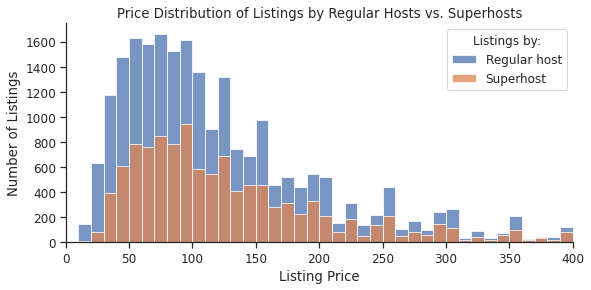

In [7]:
# Price distribution for listings by regular hosts and superhosts
sns.set(style='ticks', font_scale=1.1)
grid1 = sns.FacetGrid(list765, hue='Listings by:', height=4, aspect=2, legend_out=False)
grid1.map(plt.hist, 'price', bins=range(0, 770, 10), alpha=0.75)
grid1.set(xlim=(0, 400), xlabel='Listing Price', ylabel='Number of Listings', title='Price Distribution of Listings by Regular Hosts vs. Superhosts')
grid1.add_legend()

# Descriptive statistics of price
utils.desc_byhost(df=list765, col='price')

,regular_hosts,superhosts
count,17439.000000,10856.000000
mean,92.211767,97.575166
std,10.673836,3.319286
min,20.000000,20.000000
25%,90.000000,97.000000
50%,95.000000,98.000000
75%,100.000000,100.000000
max,100.000000,100.000000


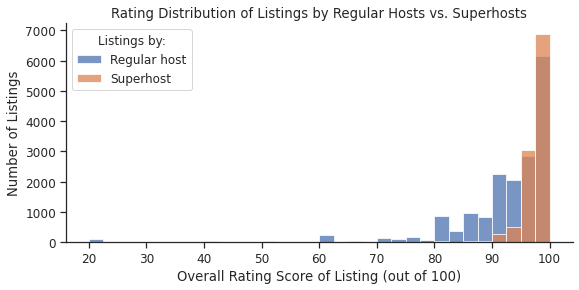

In [8]:
# Rating distribution of listings by regular hosts and superhosts
sns.set(style='ticks', font_scale=1.1)
grid2 = sns.FacetGrid(list765, hue='Listings by:', height=4, aspect=2, legend_out=False)
grid2.map(plt.hist, 'score_rtg', bins=32, alpha=0.75)
grid2.set(xlabel='Overall Rating Score of Listing (out of 100)', ylabel='Number of Listings', title='Rating Distribution of Listings by Regular Hosts vs. Superhosts')
grid2.add_legend()

# Descriptive statistics of rating
utils.desc_byhost(df=list765, col='score_rtg')

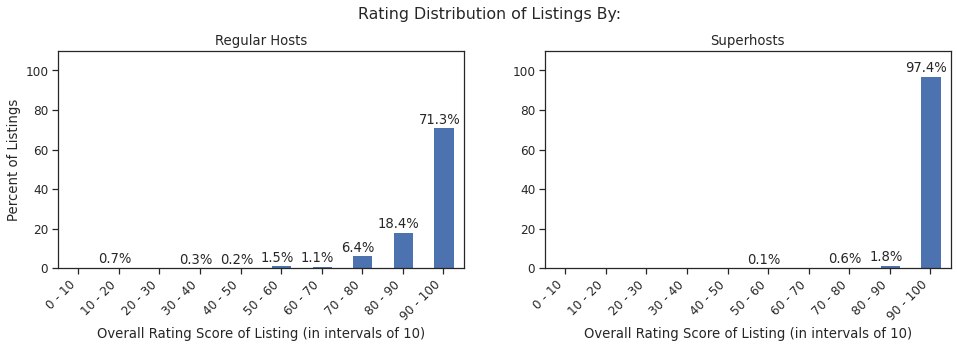

In [9]:
sns.set(style='ticks', font_scale=1.1)
fig1, ax1 = plt.subplots(1, 2, figsize=(16, 4))


# Rating distribution in relative terms
plotting.hist_pct(df=list765, ax=ax1[0], filter_val=0, title='Regular Hosts', xlab='Overall Rating Score of Listing (in intervals of 10)', ylab='Percent of Listings')
plotting.hist_pct(df=list765, ax=ax1[1], filter_val=1, title='Superhosts', xlab='Overall Rating Score of Listing (in intervals of 10)')
fig1.suptitle('Rating Distribution of Listings By:', va='bottom');

In [10]:
# Save figures
grid1.savefig('figs/q1-1-4x8.png', bbox_inches='tight')
grid2.savefig('figs/q1-2-4x8.png', bbox_inches='tight')
fig1.savefig('figs/q1-3.png', bbox_inches='tight')

### Where are the best-rated listings?

In [11]:
# Extract listings with at least 50 reviews and an overall rating of 100
rating100 = list765[(list765.number_of_reviews >= 50) & (list765.score_rtg == 100)].copy()

# Count the number of listings by neighborhood and select neighborhoods where the count is at least 10
top_nb = utils.agg_to_2cols(df=rating100, agg_col='score_rtg', agg_col_name='Number of Listings with an Average Overall Rating of 100/100', agg_by_mean=False)
top_nb = top_nb[top_nb['Number of Listings with an Average Overall Rating of 100/100'] >= 10]

# Calculate the average listing price of these listings by neighborhood
avg_price = utils.agg_to_2cols(df=rating100, agg_col='price', agg_col_name='Average Listing Price')
avg_price = avg_price[avg_price.Neighborhood.isin(top_nb.Neighborhood.tolist())]

# # Calculate the average availability of these listings by neighborhood
# avg_avail = utils.agg_to_2cols(df=rating100, agg_col='availability_365', agg_col_name='Number of Days the Listing was Available in the Last 365 Days')
# avg_avail = avg_avail[avg_avail.Neighborhood.isin(top_nb.Neighborhood.tolist())]

top_nb = pd.merge(top_nb, avg_price, on='Neighborhood', how='left').sort_values('Number of Listings with an Average Overall Rating of 100/100', ascending=False)
top_nb

,Neighborhood,Number of Listings with an Average Overall Rating of 100/100,Average Listing Price
0,Venice,29,232.45
1,Silver Lake,23,151.13
2,Long Beach,21,117.33
3,Santa Monica,17,160.82
4,Hollywood Hills West,15,263.20
5,Echo Park,13,159.62
6,Sherman Oaks,13,166.69
7,Topanga,12,183.25
8,Hollywood,11,121.36
9,Highland Park,11,100.27


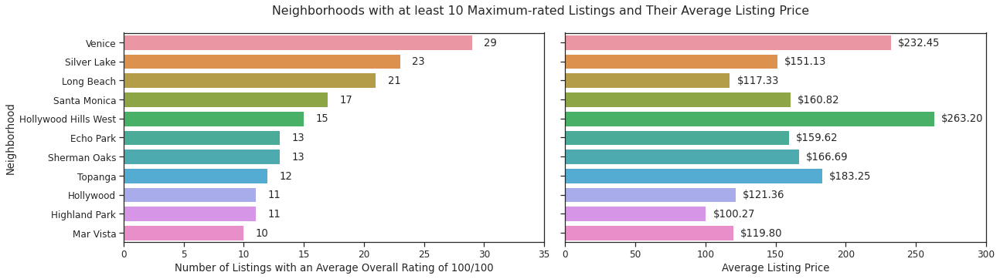

In [12]:
sns.set(style='ticks', font_scale=1.1)
fig2, ax2 = plt.subplots(1, 2, figsize=(20, 5))
plt.subplots_adjust(wspace=0.05)
fig2.suptitle('Neighborhoods with at least 10 Maximum-rated Listings and Their Average Listing Price')

# Number of Listings with an Average Overall Rating of 100/100
sns.barplot(data=top_nb, x='Number of Listings with an Average Overall Rating of 100/100', y='Neighborhood', ax=ax2[0])
ax2[0].set_xlim(0, 35)
for i in range(11):
    n = top_nb.iloc[i, 1]
    ax2[0].text(n + 1, i, f'{n}', va='center')

# Average listing price
sns.barplot(data=top_nb, x='Average Listing Price', y='Neighborhood', ax=ax2[1])
ax2[1].set_ylabel('')
ax2[1].set_yticklabels([])
ax2[1].set_xlim(0, 300)
for i in range(11):
    n = top_nb.iloc[i, 2]
    ax2[1].text(n + 5 , i, f'${n:.02f}', va='center')

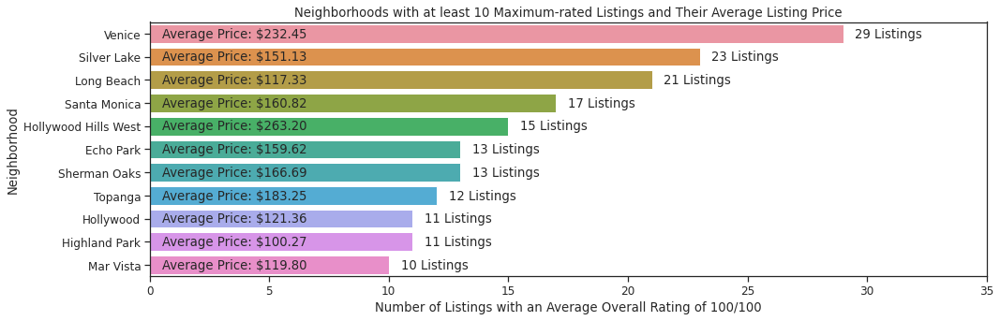

In [13]:
sns.set(style='ticks', font_scale=1.1)
fig2_2 = plt.figure(figsize=(16, 5))
plt.title('Neighborhoods with at least 10 Maximum-rated Listings and Their Average Listing Price')

# Number of Listings with an Average Overall Rating of 100/100
sns.barplot(data=top_nb, x='Number of Listings with an Average Overall Rating of 100/100', y='Neighborhood')
plt.xlim(0, 35)
for i in range(11):
    n = top_nb.iloc[i, 1]
    plt.text(n + 0.5, i, f'{n} Listings', va='center')
    
# Show average price of each neighborhood
for i in range(11):
    price = top_nb.iloc[i, 2]
    plt.text(0.5, i, f'Average Price: ${price:.02f}', va='center')

In [14]:
# Save figures
fig2.savefig('figs/q2-1-sub.png', bbox_inches='tight')
fig2_2.savefig('figs/q2-1-fig.png', bbox_inches='tight')

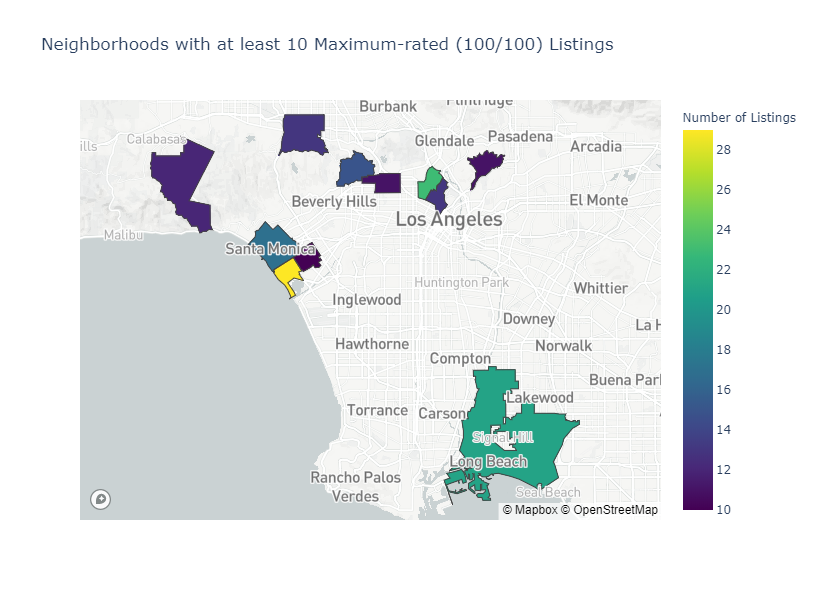

In [15]:
# Geojson for LA neighborhoods
lanb = plotting.get_langeo()

# Neighborhoods with at least 10 listings that have at least 50 reviews and an overall rating of 100
fig2map = px.choropleth_mapbox(top_nb, geojson=lanb, featureidkey='properties.name', 
                               color='Number of Listings with an Average Overall Rating of 100/100', 
                               locations='Neighborhood', center={'lat': 33.95, 'lon': -118.35}, 
                               zoom=9, height=600, width=750, color_continuous_scale='Viridis',
                               title='Neighborhoods with at least 10 Maximum-rated (100/100) Listings',
                               labels={'Number of Listings with an Average Overall Rating of 100/100': 'Number of Listings'})
fig2map.show()

### Where can we find low-cost versus high-end listings?

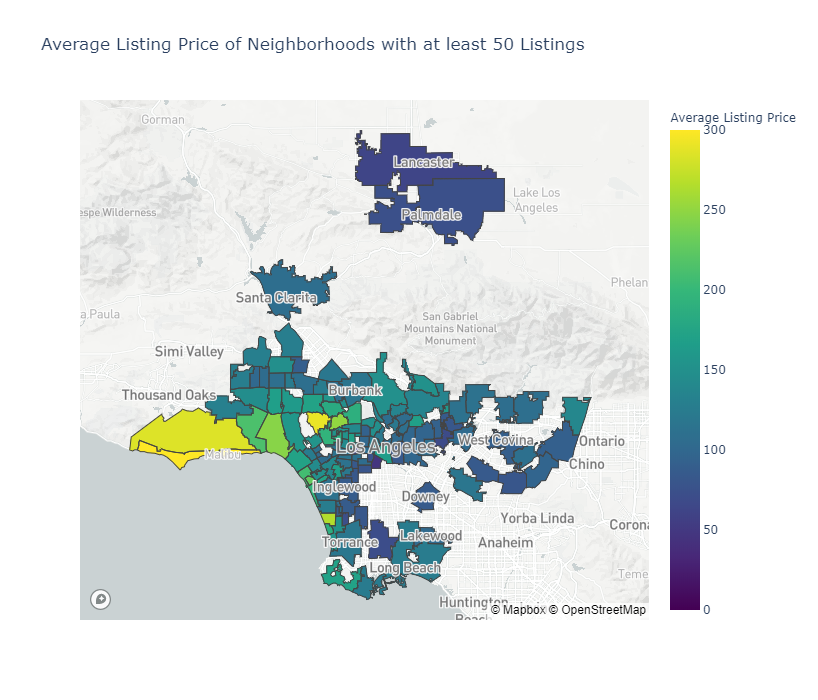

In [16]:
# Neighborhoods with at least 50 listings
nb50 = utils.agg_to_2cols(df=list765, agg_col='price', agg_col_name='num_listings', agg_by_mean=False)
nb50 = nb50[nb50.num_listings >= 50]

# Average listing price by neighborhood
prices = list765[list765.neighborhood.isin(nb50.Neighborhood)]
prices = utils.agg_to_2cols(df=prices, agg_col='price', agg_col_name='Average Listing Price')

# Choropleth map
fig3_0 = px.choropleth_mapbox(prices, geojson=lanb, featureidkey='properties.name', color='Average Listing Price', locations='Neighborhood',
                              center={'lat': 34.25, 'lon': -118.30}, zoom=8, height=700, width=800, color_continuous_scale='viridis',
                              range_color=(0, 300), title='Average Listing Price of Neighborhoods with at least 50 Listings')
fig3_0.show()

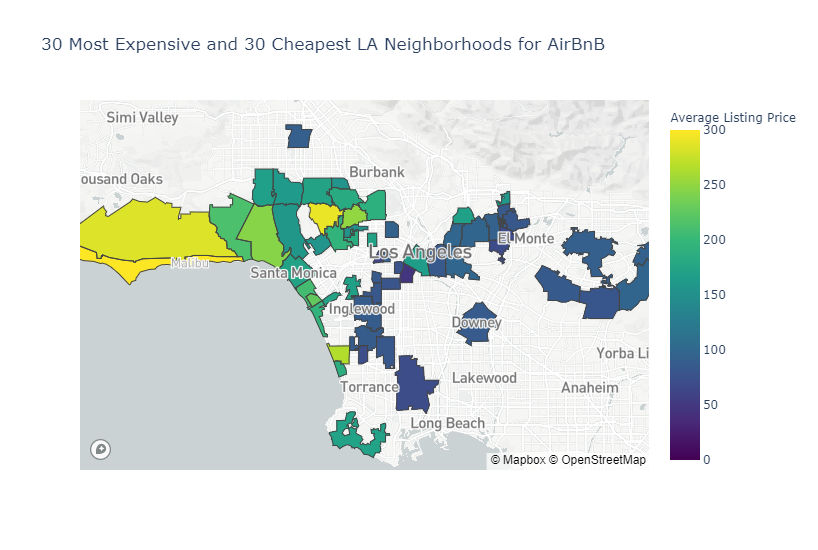

In [66]:
# 30 most expensive and 30 cheapest neighborhoods
fig3 = px.choropleth_mapbox(pd.concat([prices.iloc[:30], prices.iloc[-30:]]), geojson=lanb, featureidkey='properties.name',
                              color='Average Listing Price', locations='Neighborhood', center={'lat': 34.00, 'lon': -118.35}, 
                              zoom=8.5, height=550, width=950, color_continuous_scale='viridis', range_color=(0, 300),
                              title='30 Most Expensive and 30 Cheapest LA Neighborhoods for AirBnB')
fig3.show()

### Dependencies

In [18]:
from sklearn.model_selection import train_test_split, RandomizedSearchCV, GridSearchCV
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import mean_squared_error

from sklearn.linear_model import Lasso
from sklearn.ensemble import RandomForestRegressor

### Data

In [19]:
X_train = pd.read_pickle('data/train.pkl')
X_train.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 21337 entries, 14902 to 17315
Data columns (total 16 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   by_superhost       21337 non-null  int64  
 1   accommodates       21337 non-null  int64  
 2   security_deposit   21337 non-null  float64
 3   cleaning_fee       21337 non-null  float64
 4   extra_people       21337 non-null  float64
 5   minimum_nights     21337 non-null  int64  
 6   availability_365   21337 non-null  int64  
 7   instant_bookable   21337 non-null  int64  
 8   reviews_per_month  21337 non-null  float64
 9   prop_apartment     21337 non-null  int64  
 10  prop_house         21337 non-null  int64  
 11  room_entire        21337 non-null  int64  
 12  cancel_strict      21337 non-null  int64  
 13  cancel_flexible    21337 non-null  int64  
 14  price_tier         21337 non-null  float64
 15  price              21337 non-null  float64
dtypes: float64(6), int

In [20]:
y_train = X_train.price.copy()
X_train.drop('price', axis=1, inplace=True)
X_train.shape, y_train.shape

((21337, 15), (21337,))

In [21]:
X_val = pd.read_pickle('data/val.pkl')
X_val.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 7113 entries, 17924 to 2337
Data columns (total 16 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   by_superhost       7113 non-null   int64  
 1   accommodates       7113 non-null   int64  
 2   security_deposit   7113 non-null   float64
 3   cleaning_fee       7113 non-null   float64
 4   extra_people       7113 non-null   float64
 5   minimum_nights     7113 non-null   int64  
 6   availability_365   7113 non-null   int64  
 7   instant_bookable   7113 non-null   int64  
 8   reviews_per_month  7113 non-null   float64
 9   prop_apartment     7113 non-null   int64  
 10  prop_house         7113 non-null   int64  
 11  room_entire        7113 non-null   int64  
 12  cancel_strict      7113 non-null   int64  
 13  cancel_flexible    7113 non-null   int64  
 14  price_tier         7113 non-null   float64
 15  price              7113 non-null   float64
dtypes: float64(6), int64

In [22]:
y_val = X_val.price.copy()
X_val.drop('price', axis=1, inplace=True)
X_val.shape, y_val.shape

((7113, 15), (7113,))

In [23]:
X_test = pd.read_pickle('data/test.pkl')
X_test.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 7113 entries, 26553 to 25029
Data columns (total 16 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   by_superhost       7113 non-null   int64  
 1   accommodates       7113 non-null   int64  
 2   security_deposit   7113 non-null   float64
 3   cleaning_fee       7113 non-null   float64
 4   extra_people       7113 non-null   float64
 5   minimum_nights     7113 non-null   int64  
 6   availability_365   7113 non-null   int64  
 7   instant_bookable   7113 non-null   int64  
 8   reviews_per_month  7113 non-null   float64
 9   prop_apartment     7113 non-null   int64  
 10  prop_house         7113 non-null   int64  
 11  room_entire        7113 non-null   int64  
 12  cancel_strict      7113 non-null   int64  
 13  cancel_flexible    7113 non-null   int64  
 14  price_tier         7113 non-null   float64
 15  price              7113 non-null   float64
dtypes: float64(6), int6

In [24]:
y_test = X_test.price.copy()
X_test.drop('price', axis=1, inplace=True)
X_test.shape, y_test.shape

((7113, 15), (7113,))

In [25]:
X_train_scaled = pd.read_pickle('data/train_scaled.pkl')
X_train_scaled.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 21337 entries, 0 to 21336
Data columns (total 15 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   by_superhost       21337 non-null  float64
 1   accommodates       21337 non-null  float64
 2   security_deposit   21337 non-null  float64
 3   cleaning_fee       21337 non-null  float64
 4   extra_people       21337 non-null  float64
 5   minimum_nights     21337 non-null  float64
 6   availability_365   21337 non-null  float64
 7   instant_bookable   21337 non-null  float64
 8   reviews_per_month  21337 non-null  float64
 9   prop_apartment     21337 non-null  float64
 10  prop_house         21337 non-null  float64
 11  room_entire        21337 non-null  float64
 12  cancel_strict      21337 non-null  float64
 13  cancel_flexible    21337 non-null  float64
 14  price_tier         21337 non-null  float64
dtypes: float64(15)
memory usage: 2.4 MB


In [26]:
X_val_scaled = pd.read_pickle('data/val_scaled.pkl')
X_val_scaled.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7113 entries, 0 to 7112
Data columns (total 15 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   by_superhost       7113 non-null   float64
 1   accommodates       7113 non-null   float64
 2   security_deposit   7113 non-null   float64
 3   cleaning_fee       7113 non-null   float64
 4   extra_people       7113 non-null   float64
 5   minimum_nights     7113 non-null   float64
 6   availability_365   7113 non-null   float64
 7   instant_bookable   7113 non-null   float64
 8   reviews_per_month  7113 non-null   float64
 9   prop_apartment     7113 non-null   float64
 10  prop_house         7113 non-null   float64
 11  room_entire        7113 non-null   float64
 12  cancel_strict      7113 non-null   float64
 13  cancel_flexible    7113 non-null   float64
 14  price_tier         7113 non-null   float64
dtypes: float64(15)
memory usage: 833.7 KB


In [27]:
X_test_scaled = pd.read_pickle('data/test_scaled.pkl')
X_test_scaled.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7113 entries, 0 to 7112
Data columns (total 15 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   by_superhost       7113 non-null   float64
 1   accommodates       7113 non-null   float64
 2   security_deposit   7113 non-null   float64
 3   cleaning_fee       7113 non-null   float64
 4   extra_people       7113 non-null   float64
 5   minimum_nights     7113 non-null   float64
 6   availability_365   7113 non-null   float64
 7   instant_bookable   7113 non-null   float64
 8   reviews_per_month  7113 non-null   float64
 9   prop_apartment     7113 non-null   float64
 10  prop_house         7113 non-null   float64
 11  room_entire        7113 non-null   float64
 12  cancel_strict      7113 non-null   float64
 13  cancel_flexible    7113 non-null   float64
 14  price_tier         7113 non-null   float64
dtypes: float64(15)
memory usage: 833.7 KB


### Correlation

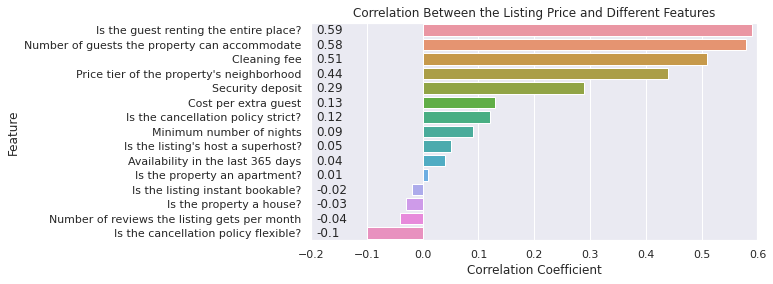

In [67]:
# Rename features for readability
Xtrain = X_train.copy()
Xtrain.columns = ['Is the listing\'s host a superhost?', 'Number of guests the property can accommodate',
                   'Security deposit', 'Cleaning fee', 'Cost per extra guest', 'Minimum number of nights',
                   'Availability in the last 365 days', 'Is the listing instant bookable?', 
                   'Number of reviews the listing gets per month', 'Is the property an apartment?', 
                   'Is the property a house?', 'Is the guest renting the entire place?', 
                   'Is the cancellation policy strict?', 'Is the cancellation policy flexible?', 
                   'Price tier of the property\'s neighborhood']

# Check correlation between the target and each feature
corr_with_target = [y_train.corr(Xtrain[feat]).round(2) for feat in Xtrain.columns]
target_corr = utils.feat_coefs(feats=Xtrain.columns, coefs=corr_with_target, feat_name='feature', coef_name='coefficient')

# Horizontal barplot
sns.set()
fig4 = plt.figure(figsize=(8, 4))
sns.barplot(data=target_corr, y='feature', x='coefficient')
plt.title('Correlation Between the Listing Price and Different Features')
plt.ylabel('Feature')
plt.xlabel('Correlation Coefficient')
plt.xlim(-0.2, 0.6)

# Label bars
for i in range(target_corr.shape[0]):
    n = target_corr.iloc[i, 1]
    plt.text(-0.19, i + 0.01, f'{n}', va='center')
            
plt.show()

### Lasso regression

In [30]:
# Select alpha = 0.01
lasso = Lasso(alpha=0.01, max_iter=1e6, random_state=0)
lasso.fit(X_train_scaled, y_train)

# Metrics
utils.score_model(model=lasso, xtest=X_val_scaled, ytest=y_val, xtrain=X_train_scaled, ytrain=y_train)

# Coefficients
lasso_coefs = utils.feat_coefs(X_train_scaled.columns, lasso.coef_)
lasso_coefs

Train R2 Score: 0.6065719093565767
Train RMSE: 83.91136698356988

R2 Score: 0.6104653517621763
RMSE: 83.14715805185911


,feat,coef
1,accommodates,0.242198
11,room_entire,0.220053
14,price_tier,0.207202
3,cleaning_fee,0.085310
2,security_deposit,0.035962
4,extra_people,0.016055
13,cancel_flexible,0.008639
10,prop_house,0.005229
0,by_superhost,0.001988
6,availability_365,0.000000


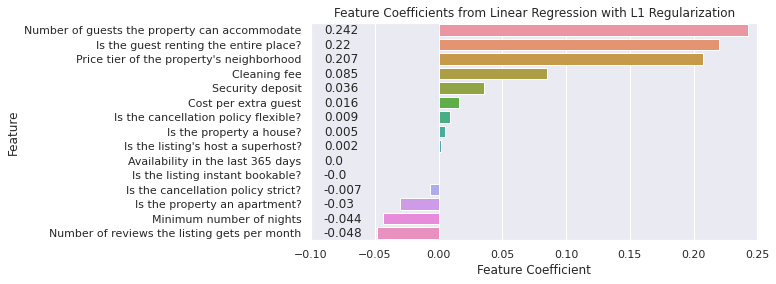

In [62]:
# Rename features
lasso_coefs.feat = ['Number of guests the property can accommodate', 
                    'Is the guest renting the entire place?', 'Price tier of the property\'s neighborhood',
                    'Cleaning fee', 'Security deposit', 'Cost per extra guest',
                    'Is the cancellation policy flexible?', 'Is the property a house?',
                    'Is the listing\'s host a superhost?', 'Availability in the last 365 days',
                    'Is the listing instant bookable?', 'Is the cancellation policy strict?', 
                    'Is the property an apartment?', 'Minimum number of nights',
                    'Number of reviews the listing gets per month']

# Horizontal barplot
sns.set()
fig4_2 = plt.figure(figsize=(8, 4))
sns.barplot(data=lasso_coefs, y='feat', x='coef')
plt.title('Feature Coefficients from Linear Regression with L1 Regularization')
plt.ylabel('Feature')
plt.xlabel('Feature Coefficient')
plt.xlim(-0.1, 0.25)

# Label bars
for i in range(lasso_coefs.shape[0]):
    n = lasso_coefs.iloc[i, 1].round(3)
    plt.text(-0.09, i + 0.01, f'{n}', va='center')
            
plt.show()

### Random Forest

In [46]:
rf = RandomForestRegressor(random_state=0)
rf.fit(X_train_scaled, y_train)
utils.score_model(model=rf, xtest=X_val_scaled, ytest=y_val, xtrain=X_train_scaled, ytrain=y_train)

# Coefficients
rf_coefs = utils.feat_coefs(X_train_scaled.columns, rf.feature_importances_)
rf_coefs

Train R2 Score: 0.9536621998059394
Train RMSE: 32.751766744164286

R2 Score: 0.7016800158733352
RMSE: 70.64789327508178


,feat,coef
11,room_entire,0.352277
1,accommodates,0.161066
3,cleaning_fee,0.097509
14,price_tier,0.093705
8,reviews_per_month,0.069817
6,availability_365,0.059598
4,extra_people,0.040001
2,security_deposit,0.031915
5,minimum_nights,0.026578
10,prop_house,0.014318


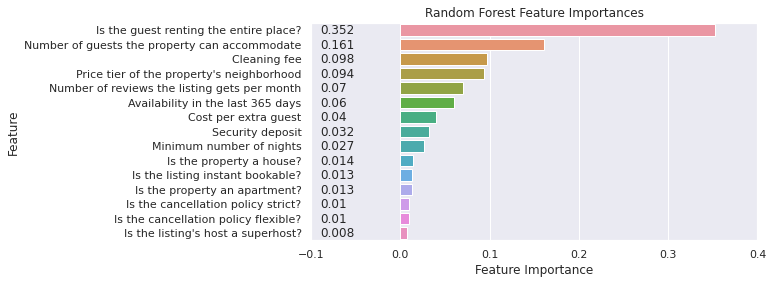

In [48]:
# Rename features
rf_coefs.feat = ['Is the guest renting the entire place?', 'Number of guests the property can accommodate',
                 'Cleaning fee', 'Price tier of the property\'s neighborhood',
                 'Number of reviews the listing gets per month', 'Availability in the last 365 days',
                 'Cost per extra guest', 'Security deposit', 'Minimum number of nights',
                 'Is the property a house?', 'Is the listing instant bookable?',
                 'Is the property an apartment?', 'Is the cancellation policy strict?',
                 'Is the cancellation policy flexible?', 'Is the listing\'s host a superhost?']

# Horizontal barplot
sns.set()
fig4_3 = plt.figure(figsize=(8, 4))
sns.barplot(data=rf_coefs, y='feat', x='coef')
plt.title('Random Forest Feature Importances')
plt.ylabel('Feature')
plt.xlabel('Feature Importance')
plt.xlim(-0.1, 0.40)

# Label bars
for i in range(rf_coefs.shape[0]):
    n = rf_coefs.iloc[i, 1].round(3)
    plt.text(-0.09, i + 0.01, f'{n}', va='center')
            
plt.show()

In [47]:
# Model
rfb = RandomForestRegressor(n_estimators=300, random_state=0)

# Parameter grid
grid = {'max_depth': [12, 16, 20],
        'min_samples_split': [2, 4, 6],
        'min_samples_leaf': [1, 2, 3],
        'max_features': [2, 4, 6],
        'max_samples': [0.4, 0.7, 1.0]}

# Grid search
rf_search = GridSearchCV(rfb, grid, cv=4, scoring='r2', n_jobs=-1, verbose=2)
rf_search.fit(X_train_scaled, y_train)

# Best estimator
print(rf_search.best_score_)
print(rf_search.best_params_)

Fitting 4 folds for each of 243 candidates, totalling 972 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done   9 tasks      | elapsed:    4.9s
[Parallel(n_jobs=-1)]: Done 132 tasks      | elapsed:   26.6s
[Parallel(n_jobs=-1)]: Done 365 tasks      | elapsed:  1.3min
/home/tri/miniconda3/envs/minimal_ds/lib/python3.8/site-packages/joblib/externals/loky/process_executor.py:688: UserWarning:

A worker stopped while some jobs were given to the executor. This can be caused by a too short worker timeout or by a memory leak.

[Parallel(n_jobs=-1)]: Done 680 tasks      | elapsed:  2.5min
[Parallel(n_jobs=-1)]: Done 972 out of 972 | elapsed:  3.8min finished


0.7118409084893609
{'max_depth': 16, 'max_features': 4, 'max_samples': 0.7, 'min_samples_leaf': 1, 'min_samples_split': 2}


In [50]:
# Best estimator
rfb = rf_search.best_estimator_
utils.score_model(model=rfb, xtest=X_val_scaled, ytest=y_val, xtrain=X_train_scaled, ytrain=y_train)

# Coefficients
rfb_coefs = utils.feat_coefs(X_train_scaled.columns, rfb.feature_importances_)
rfb_coefs

Train R2 Score: 0.8971127127048711
Train RMSE: 45.59722081757651

R2 Score: 0.718710151149297
RMSE: 70.96002174006468


,feat,coef
1,accommodates,0.220030
11,room_entire,0.194209
3,cleaning_fee,0.160483
14,price_tier,0.110988
8,reviews_per_month,0.060788
6,availability_365,0.053185
2,security_deposit,0.049805
4,extra_people,0.042313
5,minimum_nights,0.027046
10,prop_house,0.023557


In [51]:
# Test set
utils.score_model(model=rfb, xtest=X_test_scaled, ytest=y_test);

R2 Score: 0.7128312606583456
RMSE: 69.37248288855257


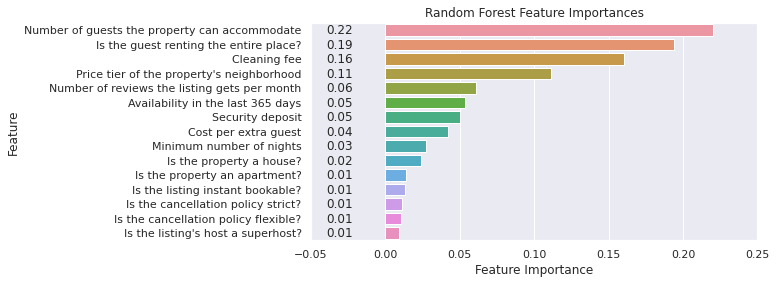

In [53]:
# Rename features
rfb_coefs.feat = ['Number of guests the property can accommodate', 'Is the guest renting the entire place?', 
                 'Cleaning fee', 'Price tier of the property\'s neighborhood',
                 'Number of reviews the listing gets per month', 'Availability in the last 365 days',
                 'Security deposit', 'Cost per extra guest', 'Minimum number of nights',
                 'Is the property a house?', 'Is the property an apartment?',
                 'Is the listing instant bookable?', 'Is the cancellation policy strict?',
                 'Is the cancellation policy flexible?', 'Is the listing\'s host a superhost?']

# Horizontal barplot
sns.set()
fig4_3_gs = plt.figure(figsize=(8, 4))
sns.barplot(data=rfb_coefs, y='feat', x='coef')
plt.title('Random Forest Feature Importances')
plt.ylabel('Feature')
plt.xlabel('Feature Importance')
plt.xlim(-0.05, 0.25)

# Label bars
for i in range(rfb_coefs.shape[0]):
    n = rfb_coefs.iloc[i, 1].round(2)
    plt.text(-0.04, i + 0.01, f'{n}', va='center')
            
plt.show()

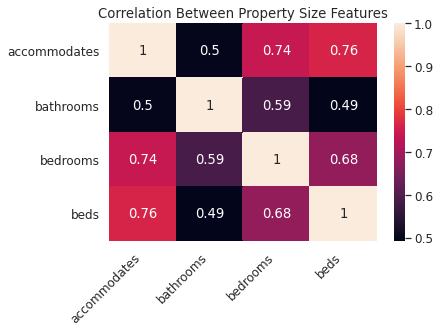

In [64]:
sns.set(font_scale=1.1)
fig4_4 = plt.figure(figsize=(6, 4))
sns.heatmap(list765[['accommodates', 'bathrooms', 'bedrooms', 'beds']].corr(), annot=True)
plt.title('Correlation Between Property Size Features')
plt.xticks(rotation=45, ha='right');

In [68]:
# Save figures
fig4.savefig('figs/q4-1.png', bbox_inches='tight')
fig4_2.savefig('figs/q4-2.png', bbox_inches='tight')
fig4_3_gs.savefig('figs/q4-3.png', bbox_inches='tight')
fig4_4.savefig('figs/q4-4.png', bbox_inches='tight')